In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

import os
import json
import pandas as pd
from PIL import Image

# Load your CSV file
csv_file = "/content/drive/MyDrive/ObjectDetection/labels.csv"
data = pd.read_csv(csv_file)

# Set your images directories
train_images_dir = "/content/drive/MyDrive/pictures/AI-image/train"
val_images_dir = "/content/drive/MyDrive/pictures/AI-image/val"
test_images_dir = "/content/drive/MyDrive/pictures/AI-image/test"

# Define the output JSON files
train_output_file = "/content/drive/MyDrive/pictures/AI-image/train/output_coco_format_train.json"
val_output_file = "/content/drive/MyDrive/pictures/AI-image/val/output_coco_format_val.json"
test_output_file = "/content/drive/MyDrive/pictures/AI-image/test/output_coco_format_test.json"

# Define the categories (classes)
categories = [
    {"id": 0, "name": "P"},
    {"id": 1, "name": "N"},
    {"id": 2, "name": "D"},
    {"id": 3, "name": "Q"},
]

# Define a function to split the data into train, val, and test
def split_data(data, train_dir, val_dir, test_dir):
    train_data = data[data['filename'].apply(lambda x: x in os.listdir(train_dir))]
    val_data = data[data['filename'].apply(lambda x: x in os.listdir(val_dir))]
    test_data = data[data['filename'].apply(lambda x: x in os.listdir(test_dir))]
    return train_data, val_data, test_data

# Define a function to convert your data
def convert_to_coco_format(data, images_dir, output_file):
    coco_data = {
        "images": [],
        "annotations": [],
        "categories": categories,
    }

    ann_id = 0
    for idx, row in data.iterrows():
        # Create image entry
        image_filename = row['filename']
        image_path = os.path.join(images_dir, image_filename)
        image = Image.open(image_path)
        width, height = image.size
        image_id = idx
        image_entry = {
            "file_name": image_filename,
            "height": height,
            "width": width,
            "id": image_id,
        }

        # Create annotation entry
        category_id = row['class']  # Assuming the 'class' column contains the class id
        x_min, y_min, x_max, y_max = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        bbox = [x_min, y_min, x_max - x_min, y_max - y_min]
        area = (x_max - x_min) * (y_max - y_min)
        annotation_entry = {
            "id": ann_id,
            "image_id": image_id,
            "category_id": category_id,
            "bbox": bbox,
            "area": area,
            "iscrowd": 0,
        }

        coco_data["images"].append(image_entry)
        coco_data["annotations"].append(annotation_entry)
        ann_id += 1

    # Save the COCO format data to a JSON file
    with open(output_file, "w") as f:
        json.dump(coco_data, f)

# Split your data into train, val, and test
train_data, val_data, test_data = split_data(data, train_images_dir, val_images_dir, test_images_dir)

# Call the conversion function for each subset
convert_to_coco_format(train_data, train_images_dir, train_output_file)
convert_to_coco_format(val_data, val_images_dir, val_output_file)
convert_to_coco_format(test_data, test_images_dir, test_output_file)

In [ ]:
import os
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer
import cv2
import json
import random
import matplotlib.pyplot as plt

def load_coco_json(json_file, image_dir):
    with open(json_file) as f:
        dataset = json.load(f)

    records = []
    for image_data in dataset["images"]:
        record = {}
        image_filename = image_data["file_name"]
        image_path = os.path.join(image_dir, image_filename)

        record["file_name"] = image_path
        record["image_id"] = image_data["id"]
        record["height"] = image_data["height"]
        record["width"] = image_data["width"]

        annotations = [
            obj
            for obj in dataset["annotations"]
            if obj["image_id"] == record["image_id"]
        ]

        objs = []
        label_to_category_id = {"P": 0, "N": 1, "D": 2, "Q": 3}

        for anno in annotations:
            obj = {
                "bbox": anno["bbox"],
                "bbox_mode": BoxMode.XYWH_ABS,
                "segmentation": [],  # Empty segmentation for simplicity
                "category_id": label_to_category_id[anno["category_id"]],  # Map the class label to its category id
                "iscrowd": anno["iscrowd"],
            }
            objs.append(obj)

        record["annotations"] = objs
        records.append(record)

    return records

# Register your train and val datasets
train_json = "/content/drive/MyDrive/pictures/AI-image/train/output_coco_format_train.json"
val_json  = "/content/drive/MyDrive/pictures/AI-image/val/output_coco_format_val.json"
test_json  = "/content/drive/MyDrive/pictures/AI-image/test/output_coco_format_test.json"


DatasetCatalog.register("my_dataset_train", lambda: load_coco_json(train_json, train_images_dir))
DatasetCatalog.register("my_dataset_val", lambda: load_coco_json(val_json, val_images_dir))
DatasetCatalog.register("my_dataset_test", lambda: load_coco_json(test_json, test_images_dir))

# Set categories and metadata
MetadataCatalog.get("my_dataset_train").set(thing_classes=["P", "N", "D", "Q"])
MetadataCatalog.get("my_dataset_val").set(thing_classes=["P", "N", "D", "Q"])
MetadataCatalog.get("my_dataset_test").set(thing_classes=["P", "N", "D", "Q"])

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
my_dataset_val_metadata = MetadataCatalog.get("my_dataset_val")
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")

In [ ]:
# DatasetCatalog.remove('my_dataset_train')
# DatasetCatalog.remove('my_dataset_val')
# DatasetCatalog.remove('my_dataset_test')

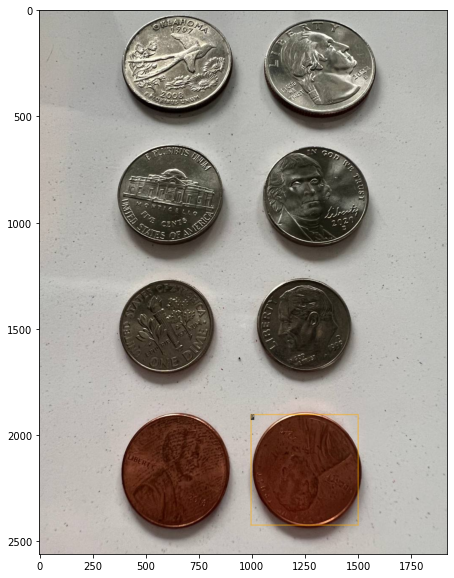

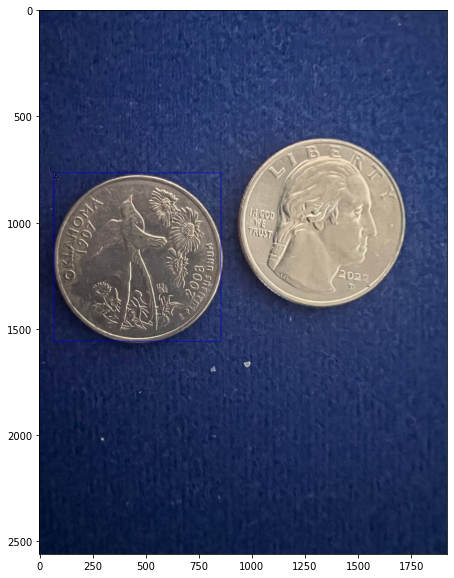

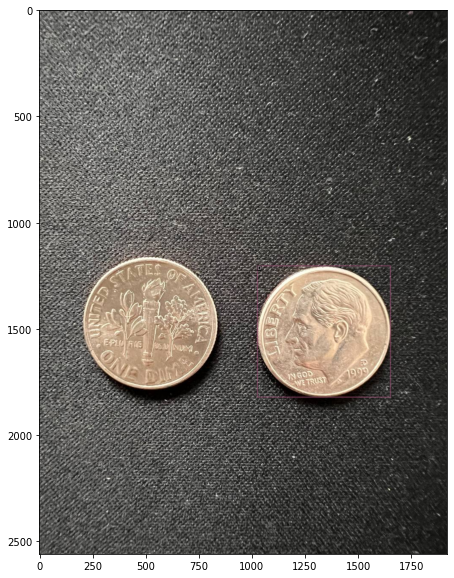

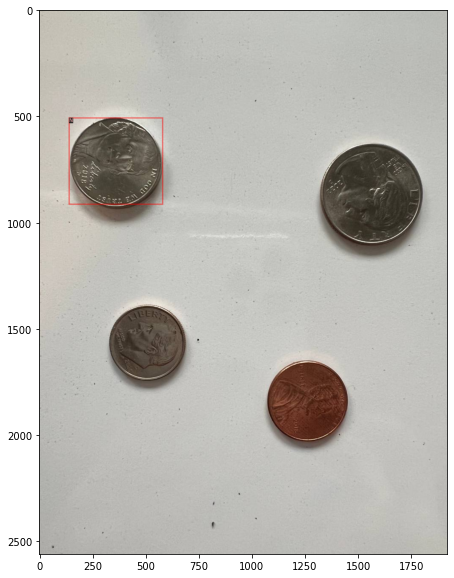

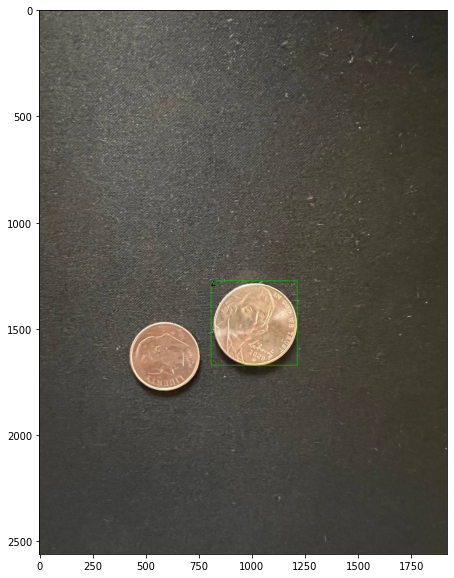

In [ ]:
def visualize_dataset(dataset_name, metadata, num_samples=5):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    sampled_dicts = random.sample(dataset_dicts, min(len(dataset_dicts), num_samples))
    
    for idx, d in enumerate(sampled_dicts, 1):
        try:
            img = cv2.imread(d["file_name"])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            visualizer = Visualizer(img, metadata=metadata, scale=2)
            vis = visualizer.draw_dataset_dict(d)
            plt.figure(figsize=(10, 10))
            plt.imshow(vis.get_image())
            plt.show()
        except Exception as e:
            print(f"Error while visualizing sample {idx}: {e}")
visualize_dataset("my_dataset_train", my_dataset_train_metadata, num_samples=5)


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.data import transforms as T

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
# Set the dataset paths
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.VAL = ("my_dataset_val",)
cfg.DATASETS.TEST = ("my_dataset_test",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000    
cfg.TEST.EVAL_PERIOD = 100  # Evaluate every N iterations
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.INPUT.AUGMENTATIONS_TRAIN = [
    T.RandomBrightness(0.9, 1.1),
    T.RandomContrast(0.9, 1.1),
    T.RandomFlip(prob=0.5),
]
# Set the validation parameters

# Set the output directory
cfg.OUTPUT_DIR = "./output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

trainer.train()

[03/25 00:59:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/25 00:59:17 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/25 00:59:37 d2.utils.events]:  eta: 1:16:15  iter: 19  total_loss: 1.519  loss_cls: 1.383  loss_box_reg: 0.121  loss_rpn_cls: 0.002845  loss_rpn_loc: 0.00196    time: 0.8943  last_time: 0.9712  data_time: 0.0562  last_data_time: 0.0379   lr: 4.9953e-06  max_mem: 4104M
[03/25 00:59:54 d2.utils.events]:  eta: 1:11:30  iter: 39  total_loss: 1.35  loss_cls: 1.235  loss_box_reg: 0.123  loss_rpn_cls: 0.003594  loss_rpn_loc: 0.001634    time: 0.8631  last_time: 0.8620  data_time: 0.0214  last_data_time: 0.0137   lr: 9.9902e-06  max_mem: 4104M
[03/25 01:00:12 d2.utils.events]:  eta: 1:11:33  iter: 59  total_loss: 1.041  loss_cls: 0.9188  loss_box_reg: 0.1312  loss_rpn_cls: 0.005854  loss_rpn_loc: 0.001864    time: 0.8648  last_time: 0.8800  data_time: 0.0231  last_data_time: 0.0224   lr: 1.4985e-05  max_mem: 4104M
[03/25 01:00:29 d2.utils.events]:  eta: 1:11:16  iter: 79  total_loss: 0.7151  loss_cls: 0.5761  loss_box_reg: 0.1342  loss_rpn_cls: 0.003152  loss_rpn_loc: 0.001863    time: 0.8

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/25 03:23:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_0004999.pth ...


{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 264, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [563, 641, 133, 134], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


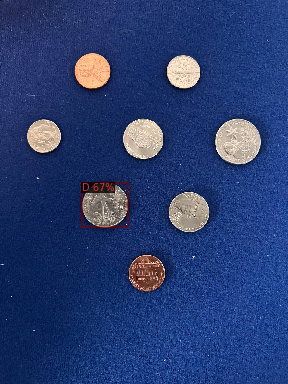

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 265, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [561, 639, 133, 133], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


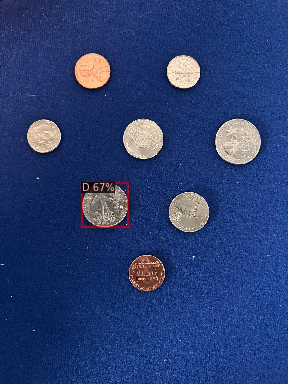

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 266, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [243, 176, 127, 125], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


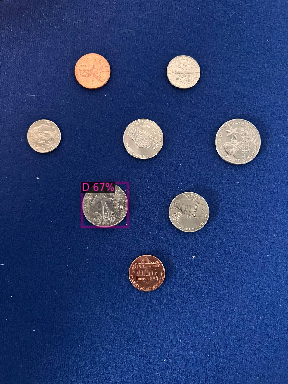

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 267, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [430, 851, 119, 120], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


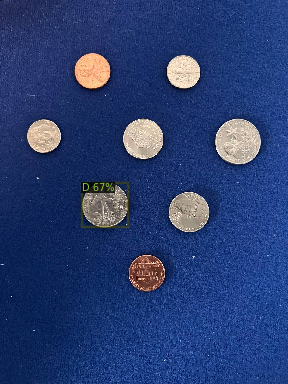

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 268, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [714, 399, 152, 156], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


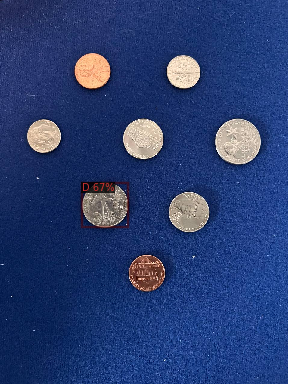

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 269, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [272, 608, 152, 152], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


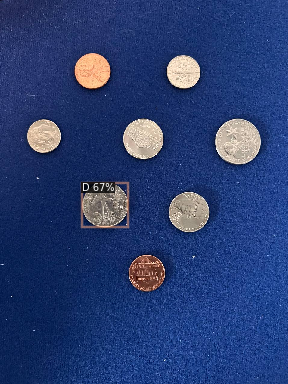

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 270, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [555, 184, 116, 117], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


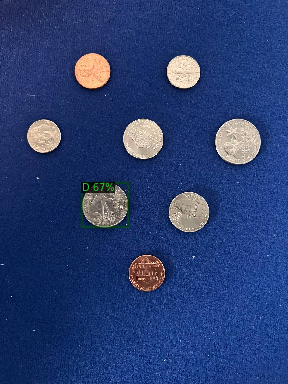

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/3.jpg', 'image_id': 271, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [87, 399, 116, 115], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


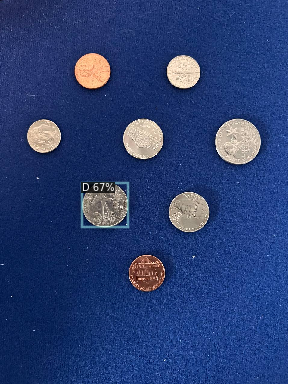

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 272, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [581, 730, 156, 152], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


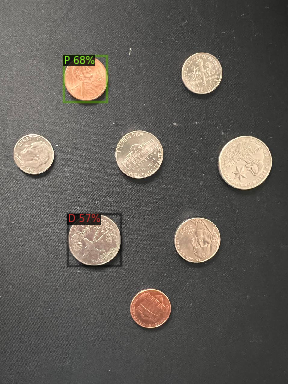

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 273, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [384, 435, 161, 165], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


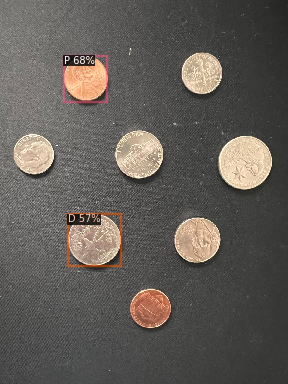

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 274, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [434, 966, 138, 128], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


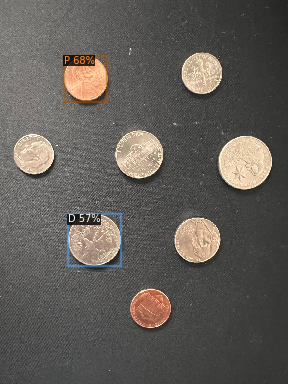

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 275, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [215, 189, 145, 150], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


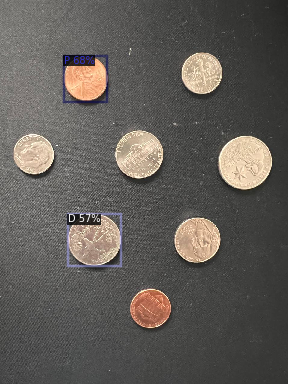

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 276, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [228, 712, 177, 179], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


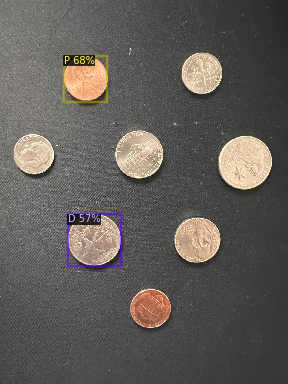

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 277, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [724, 457, 181, 188], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


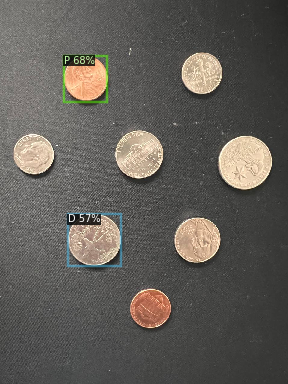

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 278, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [45, 453, 134, 134], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


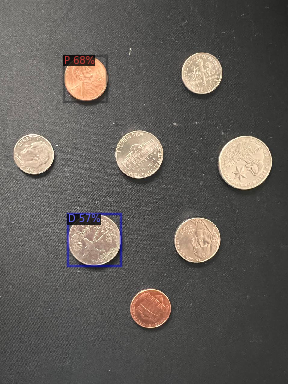

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/4.jpg', 'image_id': 279, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [608, 169, 134, 147], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


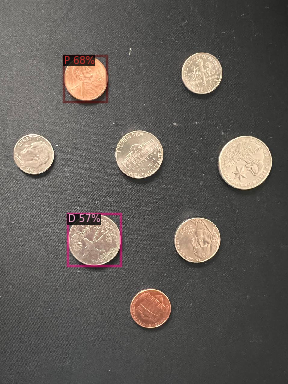

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 280, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [604, 676, 154, 155], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


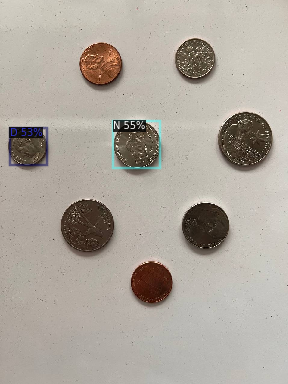

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 281, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [372, 403, 164, 160], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 1, 'iscrowd': 0}]}


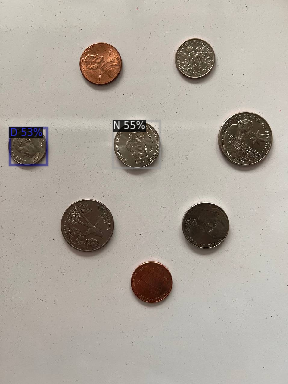

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 282, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [430, 872, 141, 142], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


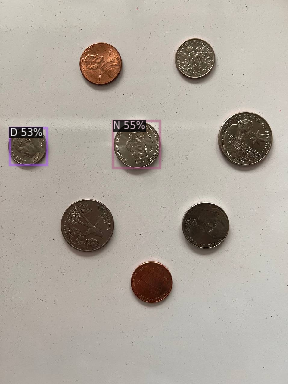

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 283, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [268, 143, 135, 146], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 0, 'iscrowd': 0}]}


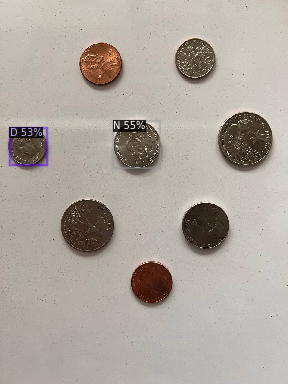

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 284, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [198, 666, 177, 176], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


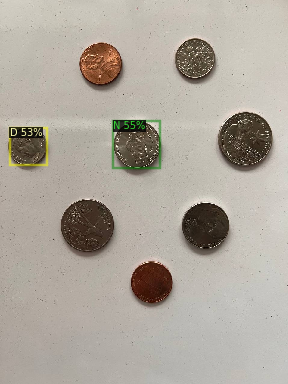

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 285, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [725, 375, 182, 180], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 3, 'iscrowd': 0}]}


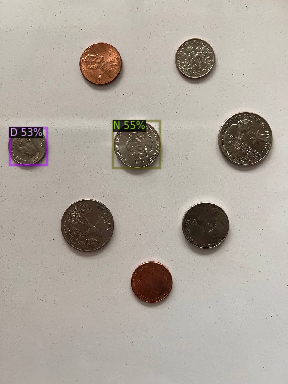

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 286, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [28, 428, 127, 131], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


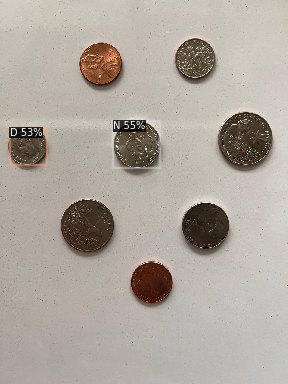

{'file_name': '/content/drive/MyDrive/pictures/AI-image/test/2.jpg', 'image_id': 287, 'height': 1280, 'width': 960, 'annotations': [{'bbox': [579, 133, 136, 137], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'segmentation': [], 'category_id': 2, 'iscrowd': 0}]}


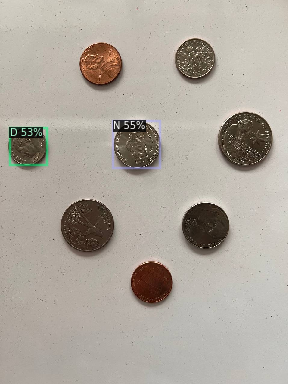

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("my_dataset_test")
for d in dataset_dicts:   
    print(d) 
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=0.3, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
def evaluate_model(cfg, dataset_name, predictor):
    evaluator = COCOEvaluator(dataset_name, cfg, False, output_dir=cfg.OUTPUT_DIR)
    val_loader = build_detection_test_loader(cfg, dataset_name)
    results = inference_on_dataset(predictor.model, val_loader, evaluator)

    bbox_metrics = results["bbox"]

    # Overall AP and AR
    ap = bbox_metrics["AP"]
    ap50 = bbox_metrics["AP50"]
    ap75 = bbox_metrics["AP75"]
    ar = bbox_metrics["APs"]

    print(f"Overall:")
    print(f"  Average Precision (AP): {ap:.2f}")
    print(f"  AP@0.50: {ap50:.2f}")
    print(f"  AP@0.75: {ap75:.2f}")
    print(f"  Average Recall (AR): {ar:.2f}")

    # Per-class AP
    print("\nPer-class AP:")
    classes = ["P", "N", "D", "Q"]
    for i, cls in enumerate(classes):
        ap_cls = bbox_metrics[f"AP-{cls}"]
        print(f"  {cls}: {ap_cls:.2f}")

In [ ]:
# Evaluate on the validation set
evaluate_model(cfg, "my_dataset_val", predictor)

# Evaluate on the test set
evaluate_model(cfg, "my_dataset_test", predictor)

[03/25 03:23:11 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/25 03:23:11 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/25 03:23:11 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/25 03:23:11 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/25 03:23:11 d2.data.common]: Serializing 68 elements to byte tensors and concatenating them all ...
[03/25 03:23:11 d2.data.common]: Serialized dataset takes 0.02 MiB
[03/25 03:23:11 d2.evaluation.evaluator]: Start inference on 68 batches
[03/25 03:23:13 d2.evaluation.evaluator]: Inference done 11/68. Dataloading: 0.0213 s/iter. Inference: 0.1294 s/iter. Eval: 0.0002 s/iter. Total: 0.1509 s/iter. ETA=0:00:08
[03/

In [ ]:
evaluate_model(cfg, "my_dataset_train", predictor)

[03/25 03:13:05 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/25 03:13:05 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/25 03:13:05 d2.evaluation.coco_evaluation]: Trying to convert 'my_dataset_train' to COCO format ...
[03/25 03:13:05 d2.data.datasets.coco]: Converting annotations of dataset 'my_dataset_train' to COCO format ...)
[03/25 03:13:05 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[03/25 03:13:05 d2.data.datasets.coco]: Conversion finished, #images: 196, #annotations: 196
[03/25 03:13:05 d2.data.datasets.coco]: Caching COCO format annotations at './output/my_dataset_train_coco_format.json' ...
[03/25 03:13:05 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/25 03:13:05 d2.dat